## Exploratory Data Analysis

This section is to explore the data, in terms of its attributes and properties, to determine areas of further analysis.

Some data dimensions and distribution break-downs will be displayed in this section as well.










In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
import numpy as np

import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.tsa.seasonal import seasonal_decompose as sd
from statsmodels.tsa.seasonal import STL
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import range_unit_root_test
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss

In [ ]:
data = pd.read_csv("./airtraffic.csv", header=0) # set header=1 for naming purposes

In [ ]:
data.head()

,Activity Period,Activity Period Start Date,Operating Airline,Operating Airline IATA Code,Published Airline,Published Airline IATA Code,GEO Summary,GEO Region,Activity Type Code,Price Category Code,Terminal,Boarding Area,Passenger Count,data_as_of,data_loaded_at
0,199907,1999/07/01,ATA Airlines,TZ,ATA Airlines,TZ,Domestic,US,Deplaned,Low Fare,Terminal 1,B,"31,432",2023/12/21 12:05:27 AM,2024/01/20 07:02:35 AM
1,199907,1999/07/01,ATA Airlines,TZ,ATA Airlines,TZ,Domestic,US,Enplaned,Low Fare,Terminal 1,B,"31,353",2023/12/21 12:05:27 AM,2024/01/20 07:02:35 AM
2,199907,1999/07/01,ATA Airlines,TZ,ATA Airlines,TZ,Domestic,US,Thru / Transit,Low Fare,Terminal 1,B,"2,518",2023/12/21 12:05:27 AM,2024/01/20 07:02:35 AM
3,199907,1999/07/01,Aeroflot Russian International Airlines,NaN,Aeroflot Russian International Airlines,NaN,International,Europe,Deplaned,Other,Terminal 2,D,"1,324",2023/12/21 12:05:27 AM,2024/01/20 07:02:35 AM
4,199907,1999/07/01,Aeroflot Russian International Airlines,NaN,Aeroflot Russian International Airlines,NaN,International,Europe,Enplaned,Other,Terminal 2,D,"1,198",2023/12/21 12:05:27 AM,2024/01/20 07:02:35 AM


Basic data dimensions

In [ ]:
print(f"The dimension in the original data is {data.shape}")

The dimension in the original data is (35172, 15)


In [ ]:
data.columns = [
    "activity_period", "start_date", "airline", "operating_code",
    "published_airline", "published_code","geo", "region", "activity_code",
    "price_category", "terminal", "boarding_area", "passengers",
    "data_as_of", "data_load_time"
]

In [ ]:
data.head()

,activity_period,start_date,airline,operating_code,published_airline,published_code,geo,region,activity_code,price_category,terminal,boarding_area,passengers,data_as_of,data_load_time
0,199907,1999/07/01,ATA Airlines,TZ,ATA Airlines,TZ,Domestic,US,Deplaned,Low Fare,Terminal 1,B,"31,432",2023/12/21 12:05:27 AM,2024/01/20 07:02:35 AM
1,199907,1999/07/01,ATA Airlines,TZ,ATA Airlines,TZ,Domestic,US,Enplaned,Low Fare,Terminal 1,B,"31,353",2023/12/21 12:05:27 AM,2024/01/20 07:02:35 AM
2,199907,1999/07/01,ATA Airlines,TZ,ATA Airlines,TZ,Domestic,US,Thru / Transit,Low Fare,Terminal 1,B,"2,518",2023/12/21 12:05:27 AM,2024/01/20 07:02:35 AM
3,199907,1999/07/01,Aeroflot Russian International Airlines,NaN,Aeroflot Russian International Airlines,NaN,International,Europe,Deplaned,Other,Terminal 2,D,"1,324",2023/12/21 12:05:27 AM,2024/01/20 07:02:35 AM
4,199907,1999/07/01,Aeroflot Russian International Airlines,NaN,Aeroflot Russian International Airlines,NaN,International,Europe,Enplaned,Other,Terminal 2,D,"1,198",2023/12/21 12:05:27 AM,2024/01/20 07:02:35 AM


In [ ]:
# statistics: avg, total
# number of instances of data: count
# dimensions
# check for NA values
# data types: discrete vs continuous

In [ ]:
def understand_df(data):

    # Dimensions of dataset
    print(f"The dimension in the original data is {data.shape} \n")

    # Head of dataset
    print("First 10 rows of the dataset are \n", data.head(10), "\n\n")

    # Summary of dataset
    print("Summary of the dataset is \n", data.describe(), "\n\n")

    # Stats of dataset
    stats = []
    for col in data.columns:
        stats.append((col, data[col].nunique(), data[col].isnull().sum() * 100 / data.shape[0], data[col].value_counts(normalize=True, dropna=False).values[0] * 100, data[col].dtype))

    stats_df = pd.DataFrame(stats, columns=['Feature', 'Unique_values', 'Percentage of missing values', 'Percentage of values in the biggest category', 'type'])
    print("Statistics of the dataset are \n", stats_df.sort_values('Percentage of missing values', ascending=False), "\n\n")

In [ ]:
understand_df(data)

The dimension in the original data is (35172, 15) 

First 10 rows of the dataset are 
    activity_period  start_date                                  airline  \
0           199907  1999/07/01                             ATA Airlines   
1           199907  1999/07/01                             ATA Airlines   
2           199907  1999/07/01                             ATA Airlines   
3           199907  1999/07/01  Aeroflot Russian International Airlines   
4           199907  1999/07/01  Aeroflot Russian International Airlines   
5           199907  1999/07/01                               Air Canada   
6           199907  1999/07/01                               Air Canada   
7           199907  1999/07/01                                Air China   
8           199907  1999/07/01                                Air China   
9           199907  1999/07/01                               Air Europe   

  operating_code                        published_airline published_code  \
0          

In [ ]:
#breakdown = pd.DataFrame(data.time.value_counts())
#breakdown
data['yy-mm'] = pd.to_datetime(data['start_date']).dt.strftime('%Y-%m')
data['year'] = pd.to_datetime(data['start_date']).dt.strftime('%Y')
data['month'] = pd.to_datetime(data['start_date']).dt.strftime('%m')

In [ ]:
data.head()

,activity_period,start_date,airline,operating_code,published_airline,published_code,geo,region,activity_code,price_category,terminal,boarding_area,passengers,data_as_of,data_load_time,yy-mm,year,month
0,199907,1999/07/01,ATA Airlines,TZ,ATA Airlines,TZ,Domestic,US,Deplaned,Low Fare,Terminal 1,B,"31,432",2023/12/21 12:05:27 AM,2024/01/20 07:02:35 AM,1999-07,1999,07
1,199907,1999/07/01,ATA Airlines,TZ,ATA Airlines,TZ,Domestic,US,Enplaned,Low Fare,Terminal 1,B,"31,353",2023/12/21 12:05:27 AM,2024/01/20 07:02:35 AM,1999-07,1999,07
2,199907,1999/07/01,ATA Airlines,TZ,ATA Airlines,TZ,Domestic,US,Thru / Transit,Low Fare,Terminal 1,B,"2,518",2023/12/21 12:05:27 AM,2024/01/20 07:02:35 AM,1999-07,1999,07
3,199907,1999/07/01,Aeroflot Russian International Airlines,NaN,Aeroflot Russian International Airlines,NaN,International,Europe,Deplaned,Other,Terminal 2,D,"1,324",2023/12/21 12:05:27 AM,2024/01/20 07:02:35 AM,1999-07,1999,07
4,199907,1999/07/01,Aeroflot Russian International Airlines,NaN,Aeroflot Russian International Airlines,NaN,International,Europe,Enplaned,Other,Terminal 2,D,"1,198",2023/12/21 12:05:27 AM,2024/01/20 07:02:35 AM,1999-07,1999,07


In [ ]:
data.passengers.describe()

count     35172
unique    21439
top           1
freq         21
Name: passengers, dtype: object

In [ ]:
data['passengers'] = data['passengers'].str.replace(',', '')

In [ ]:
data.dtypes

activity_period       int64
start_date           object
airline              object
operating_code       object
published_airline    object
published_code       object
geo                  object
region               object
activity_code        object
price_category       object
terminal             object
boarding_area        object
passengers           object
data_as_of           object
data_load_time       object
yy-mm                object
year                 object
month                object
dtype: object

In [ ]:
data = data.astype({"passengers": "float32",
             "year": "int32",
             "month": "int32"
             })
# in order for this to work

In [ ]:
data.passengers.describe()

count     35172.000000
mean      28000.507812
std       62772.761719
min           0.000000
25%        4452.000000
50%        8634.000000
75%       19893.750000
max      856501.000000
Name: passengers, dtype: float64

In [ ]:
data.passengers.value_counts()

1.0         21
2.0         19
10.0        16
4.0         16
138.0       14
            ..
326272.0     1
43928.0      1
320658.0     1
61687.0      1
21211.0      1
Name: passengers, Length: 21439, dtype: int64

The general description of monthly passenger count is:
1. Mean is roughly 28000
2. Standard deviation is roughly 62772
3. 25th percentile and 75th percentile are 4452 and 19893
4. Median is roughly 8634
5. Max and min are 0 and 856501

NOTE: passenger count is on a monthly basis.

In [ ]:
from scipy.stats import norm

# create mu, sigma
mu, sigma = data.passengers.mean(), data.passengers.std()

# standardize data
data["z"] = data["passengers"].apply(lambda x: (x-mu)/sigma)
# not this: np.random.normal(mu, sigma, 239)

In [ ]:
# Plotting can be repetitive. Here's a function that automates the process.

def plot_time_series(df, x, y, title, xlabel, ylabel, compare=False, y2=None, ylabel2=None, color="blue", figsize=False):
    if figsize is True:
      f, ax = plt.subplots(nrows=1, ncols=1, figsize=figsize)
    else:
      f, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 5))
    sns.lineplot(data=df, x=df[x], y=df[y], color=color, ax=ax)

    # For comparisons:
    if compare == True:
      plt.plot(df[y2], label=ylabel2, color = 'red')
      plt.title("Actual vs Predicted Plane Ticket Interest over Time")
    else:
      plt.title(title)
    plt.xlabel(xlabel)
    plt.legend()
    plt.ylabel(ylabel)
    plt.rc({'font.size': 16})
    plt.tight_layout()
    plt.show()

In [ ]:
data.columns

Index(['activity_period', 'start_date', 'airline', 'operating_code',
       'published_airline', 'published_code', 'geo', 'region', 'activity_code',
       'price_category', 'terminal', 'boarding_area', 'passengers',
       'data_as_of', 'data_load_time', 'yy-mm', 'year', 'month', 'z'],
      dtype='object')

#### By Year

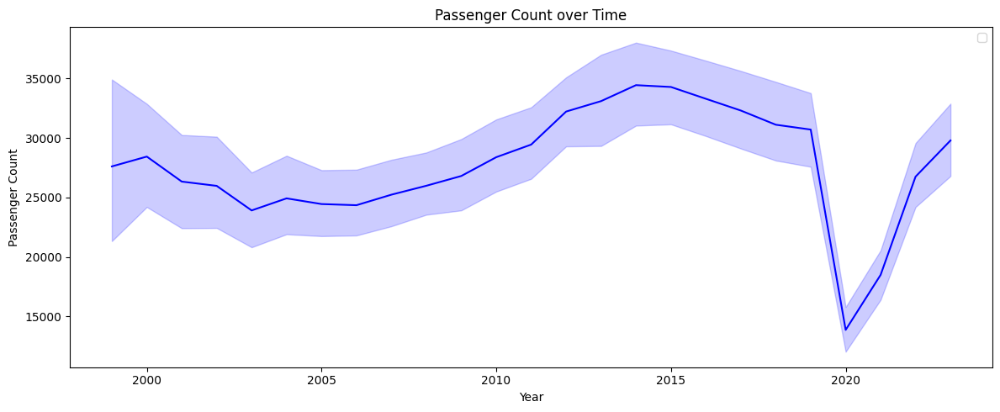

In [ ]:
plot_time_series(df=data, x="year", y="passengers",
                 title="Passenger Count over Time",
                 xlabel="Year", ylabel="Passenger Count")

#### Overall

In [ ]:
data.reset_index()

,index,activity_period,start_date,airline,operating_code,published_airline,published_code,geo,region,activity_code,price_category,terminal,boarding_area,passengers,data_as_of,data_load_time,yy-mm,year,month,z
0,0,199907,1999/07/01,ATA Airlines,TZ,ATA Airlines,TZ,Domestic,US,Deplaned,Low Fare,Terminal 1,B,31432.0,2023/12/21 12:05:27 AM,2024/01/20 07:02:35 AM,1999-07,1999,7,0.054665
1,1,199907,1999/07/01,ATA Airlines,TZ,ATA Airlines,TZ,Domestic,US,Enplaned,Low Fare,Terminal 1,B,31353.0,2023/12/21 12:05:27 AM,2024/01/20 07:02:35 AM,1999-07,1999,7,0.053407
2,2,199907,1999/07/01,ATA Airlines,TZ,ATA Airlines,TZ,Domestic,US,Thru / Transit,Low Fare,Terminal 1,B,2518.0,2023/12/21 12:05:27 AM,2024/01/20 07:02:35 AM,1999-07,1999,7,-0.405948
3,3,199907,1999/07/01,Aeroflot Russian International Airlines,NaN,Aeroflot Russian International Airlines,NaN,International,Europe,Deplaned,Other,Terminal 2,D,1324.0,2023/12/21 12:05:27 AM,2024/01/20 07:02:35 AM,1999-07,1999,7,-0.424969
4,4,199907,1999/07/01,Aeroflot Russian International Airlines,NaN,Aeroflot Russian International Airlines,NaN,International,Europe,Enplaned,Other,Terminal 2,D,1198.0,2023/12/21 12:05:27 AM,2024/01/20 07:02:35 AM,1999-07,1999,7,-0.426977
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35167,35167,202311,2023/11/01,Virgin Atlantic,VS,Virgin Atlantic,VS,International,Europe,Enplaned,Other,International,A,7173.0,2023/12/21 12:05:28 AM,2024/01/20 07:02:35 AM,2023-11,2023,11,-0.331792
35168,35168,202311,2023/11/01,WestJet Airlines,WS,WestJet Airlines,WS,International,Canada,Deplaned,Other,International,A,1965.0,2023/12/21 12:05:28 AM,2024/01/20 07:02:35 AM,2023-11,2023,11,-0.414758
35169,35169,202311,2023/11/01,WestJet Airlines,WS,WestJet Airlines,WS,International,Canada,Enplaned,Other,International,A,1963.0,2023/12/21 12:05:28 AM,2024/01/20 07:02:35 AM,2023-11,2023,11,-0.414790
35170,35170,202311,2023/11/01,ZIPAIR Tokyo Inc,ZG,ZIPAIR Tokyo Inc,ZG,International,Asia,Deplaned,Other,International,A,4599.0,2023/12/21 12:05:28 AM,2024/01/20 07:02:35 AM,2023-11,2023,11,-0.372797


In [ ]:
data["index"] = data.index

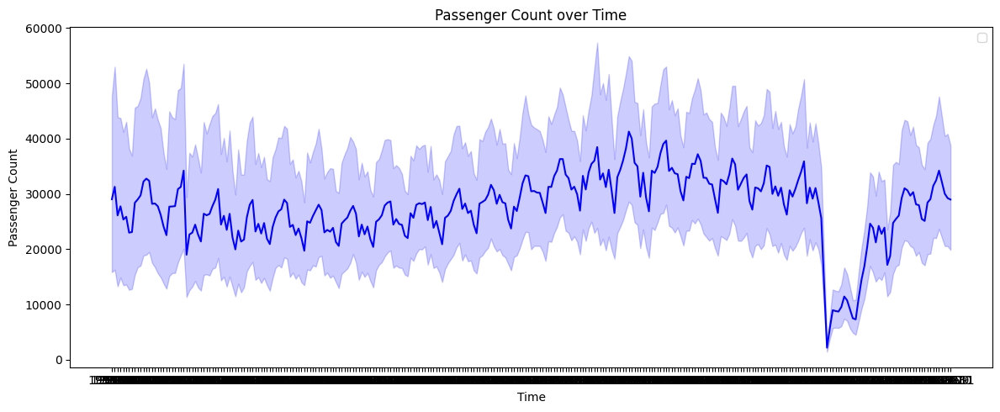

In [ ]:
plot_time_series(df=data, x="yy-mm", y="passengers",
                 title="Passenger Count over Time",
                 xlabel="Time", ylabel="Passenger Count", figsize=(24, 8))

Why is there a range of values?
It could be that data collection took place multiple times a day so we need a method to account for the difference.

## Data Filtering and Breakdowns

#### More breakdowns by airlines and months

In [ ]:
airmonth = pd.DataFrame(data.groupby(["airline", "yy-mm"], as_index=False).agg({'passengers': [np.sum, np.mean]}))

In [ ]:
airgeoregion = pd.DataFrame(data.groupby(["airline", "yy-mm", "geo", "region"]).agg({'passengers': [np.sum, np.mean]})).reset_index()
airgeoregion.columns = ["airline", "yy-mm", "geo", "region", "total_passengers", "avg_passengers"]
airgeoregion.head()

,airline,yy-mm,geo,region,total_passengers,avg_passengers
0,ABC Aerolineas S.A. de C.V. dba Interjet,2018-03,International,Mexico,2302.0,1151.0
1,ABC Aerolineas S.A. de C.V. dba Interjet,2018-04,International,Mexico,4083.0,2041.5
2,ABC Aerolineas S.A. de C.V. dba Interjet,2018-05,International,Mexico,3846.0,1923.0
3,ABC Aerolineas S.A. de C.V. dba Interjet,2018-06,International,Mexico,5354.0,2677.0
4,ABC Aerolineas S.A. de C.V. dba Interjet,2018-07,International,Mexico,4911.0,2455.5


In [ ]:
actgeoregion = pd.DataFrame(data.groupby(["activity_code", "yy-mm", "geo", "region"]).agg({'passengers': [np.sum, np.mean]})).reset_index()
actgeoregion.columns = ["activity_code", "yy-mm", "geo", "region", "total_passengers", "avg_passengers"]
actgeoregion.head()

,activity_code,yy-mm,geo,region,total_passengers,avg_passengers
0,Deplaned,1999-07,Domestic,US,1617446.0,62209.460938
1,Deplaned,1999-07,International,Asia,148933.0,11456.384766
2,Deplaned,1999-07,International,Australia / Oceania,9202.0,9202.000000
3,Deplaned,1999-07,International,Canada,55281.0,11056.200195
4,Deplaned,1999-07,International,Central America,3947.0,3947.000000


In [ ]:
pricegeoregion = pd.DataFrame(data.groupby(["price_category", "yy-mm", "geo", "region"]).agg({'passengers': [np.sum, np.mean]})).reset_index()
pricegeoregion.columns = ["price_category", "yy-mm", "geo", "region", "total_passengers", "avg_passengers"]
pricegeoregion.head()

,price_category,yy-mm,geo,region,total_passengers,avg_passengers
0,Low Fare,1999-07,Domestic,US,232920.0,21174.544922
1,Low Fare,1999-08,Domestic,US,237611.0,21601.000000
2,Low Fare,1999-09,Domestic,US,187417.0,18741.699219
3,Low Fare,1999-10,Domestic,US,191218.0,19121.800781
4,Low Fare,1999-11,Domestic,US,191223.0,17383.908203


In [ ]:
comprehensive = pd.DataFrame(data.groupby(["airline", "yy-mm", "geo", "region", "price_category"]).agg({'passengers': [np.sum, np.mean]})).reset_index()
comprehensive.columns = ["airline", "yy-mm", "geo", "region", "price_category", "total_passengers", "avg_passengers"]
comprehensive.head()

,airline,yy-mm,geo,region,price_category,total_passengers,avg_passengers
0,ABC Aerolineas S.A. de C.V. dba Interjet,2018-03,International,Mexico,Other,2302.0,1151.0
1,ABC Aerolineas S.A. de C.V. dba Interjet,2018-04,International,Mexico,Other,4083.0,2041.5
2,ABC Aerolineas S.A. de C.V. dba Interjet,2018-05,International,Mexico,Other,3846.0,1923.0
3,ABC Aerolineas S.A. de C.V. dba Interjet,2018-06,International,Mexico,Other,5354.0,2677.0
4,ABC Aerolineas S.A. de C.V. dba Interjet,2018-07,International,Mexico,Other,4911.0,2455.5


In [ ]:
airmonth.head(10), airmonth.tail(10)

(                                    airline    yy-mm passengers        
                                                             sum    mean
 0  ABC Aerolineas S.A. de C.V. dba Interjet  2018-03     2302.0  1151.0
 1  ABC Aerolineas S.A. de C.V. dba Interjet  2018-04     4083.0  2041.5
 2  ABC Aerolineas S.A. de C.V. dba Interjet  2018-05     3846.0  1923.0
 3  ABC Aerolineas S.A. de C.V. dba Interjet  2018-06     5354.0  2677.0
 4  ABC Aerolineas S.A. de C.V. dba Interjet  2018-07     4911.0  2455.5
 5  ABC Aerolineas S.A. de C.V. dba Interjet  2018-08     5831.0  2915.5
 6  ABC Aerolineas S.A. de C.V. dba Interjet  2018-09     4832.0  2416.0
 7  ABC Aerolineas S.A. de C.V. dba Interjet  2018-10     5963.0  2981.5
 8  ABC Aerolineas S.A. de C.V. dba Interjet  2018-11     4945.0  2472.5
 9  ABC Aerolineas S.A. de C.V. dba Interjet  2018-12    12627.0  6313.5,
                  airline    yy-mm passengers        
                                          sum    mean
 12149  XL Airw

In [ ]:
airmonth.columns = ['airline', 'yy-mm', 'total_passengers', 'avg_passengers']

In [ ]:
airmonth["total_passengers"].describe()

count    1.215900e+04
mean     8.099628e+04
std      2.180501e+05
min      1.000000e+00
25%      1.080050e+04
50%      1.885000e+04
75%      4.235950e+04
max      2.398387e+06
Name: total_passengers, dtype: float64

In [ ]:
airmonth["avg_passengers"].describe()

count     12159.000000
mean      19783.937500
std       28116.089844
min           1.000000
25%        5312.000000
50%        9318.500000
75%       19118.500000
max      293340.000000
Name: avg_passengers, dtype: float64

#### Track our many new DataFrames!!

In [ ]:
dfnames = ["data", "airmonth", "airgeoregion", "actgeoregion", "pricegeoregion", "comprehensive"]

Use a different visualization tool Plotly for visibility

In [ ]:
airmonth["year"] = airmonth["yy-mm"].apply(lambda x: x.split("-")[0])
airmonth["month"] = airmonth["yy-mm"].apply(lambda x: x.split("-")[1])

In [ ]:
comprehensive["year"] = comprehensive["yy-mm"].apply(lambda x: x.split("-")[0])
comprehensive["month"] = comprehensive["yy-mm"].apply(lambda x: x.split("-")[1])

In [ ]:
actgeoregion["Mavg"] = actgeoregion["avg_passengers"] / 1000000
actgeoregion["Mtotal"] = actgeoregion["total_passengers"] / 1000000
airgeoregion["Mavg"] = airgeoregion["avg_passengers"] / 1000000
airgeoregion["Mtotal"] = airgeoregion["total_passengers"] / 1000000
pricegeoregion["Mavg"] = pricegeoregion["avg_passengers"] / 1000000
pricegeoregion["Mtotal"] = pricegeoregion["total_passengers"] / 1000000
comprehensive["Mavg"] = comprehensive["avg_passengers"] / 1000000
comprehensive["Mtotal"] = comprehensive["total_passengers"] / 1000000

https://plotly.com/python/styling-plotly-express/#builtin-plotly-express-styling-arguments

In [ ]:
fig = px.line(airmonth, x='yy-mm', y='avg_passengers', color='airline')
fig.update_layout(title='Passenger Count over Time',
                   xaxis_title='Time',
                   yaxis_title='Passenger Count')
fig.show()

Notably, all airlines suffered a huge drop in passenger count in 2020. Likely because of covid lockdowns, government restrictions on travel, and business freezing. Interestingly, the 2008 financial crisis did not have a big impact on air travel.

We can see that the United airlines had the largest peak between 2010 and 2015, and in other periods, fare about median or average.

Delta Airlines appears to have largest variance, as the passenger count vary significantly across time, especially in 2015-2020, where it comfortably overtook the other airlines.

American airlines is another key player in the aviation industry. It's not hard to see how many passengers choose American airlines.

There are many airlines that have relatively low number of passengers. This does NOT reflect their lack of competitiveness in the market, because:

(1). The airport is SF. It does not reflect passenger count elsewhere.

(2). Many international airlines do not carry passengers domestically, despite their prevalence in SF. Thus, the key players are American airlines

In [ ]:
airmonth.columns

Index(['airline', 'yy-mm', 'total_passengers', 'avg_passengers'], dtype='object')

In [ ]:
fig = px.line(airmonth, x='yy-mm', y='total_passengers', color='airline')
fig.update_layout(title='Passenger Count over Time',
                   xaxis_title='Time',
                   yaxis_title='Passenger Count')
fig.show()

In [ ]:
for x in airmonth.airline.unique():
  fig = px.box(airmonth[airmonth["airline"]==x], x="year", y="avg_passengers", title=f"{x}: Average Passengers",
               width=1000, height=700)
  fig.show()

In [ ]:
for x in airmonth.airline.unique():
  fig = px.box(airmonth[airmonth["airline"]==x], x="year", y="total_passengers", title=f"{x}: Total Passengers",
               width=1000, height=700)
  fig.show()

In [ ]:
airgeoregion.columns

Index(['airline', 'yy-mm', 'geo', 'region', 'total_passengers',
       'avg_passengers', 'Mavg', 'Mtotal'],
      dtype='object')

In [ ]:
fig = px.histogram(airgeoregion, x="geo", y="total_passengers", color="region",
                   title="Total Passengers by Geography", template="plotly",
                   barmode='group', histfunc='avg', text_auto=True)
fig.show()

In [ ]:
fig = px.histogram(airgeoregion, x="geo", y="total_passengers", color="region",
                   title="Total Passengers by Geography", template="plotly",
                   text_auto=True)
fig.show()

In [ ]:
actgeoregion.columns

Index(['activity_code', 'yy-mm', 'geo', 'region', 'total_passengers',
       'avg_passengers', 'Mavg', 'Mtotal'],
      dtype='object')

In [ ]:
fig = px.histogram(actgeoregion, x="activity_code", y="avg_passengers", color="geo",
                   title="Average Passengers by Activity and Geography", template="plotly",
                   barmode='group', histfunc='avg', text_auto=True,
                   width=750, height=750)
fig.show()

In [ ]:
fig = px.histogram(actgeoregion, x="activity_code", y="avg_passengers", color="region",
                   title="Average Passengers by Geography", template="plotly",
                   barmode='group', histfunc='avg', text_auto=True)
fig.show()

In [ ]:
fig = px.histogram(actgeoregion, x="activity_code", y="total_passengers", color="region",
                   title="Total Passengers by Geography", template="plotly",
                   barmode='group', text_auto=True)
fig.show()

In [ ]:
actgeoregion.head()

,activity_code,yy-mm,geo,region,total_passengers,avg_passengers,Mavg,Mtotal
0,Deplaned,1999-07,Domestic,US,1617446.0,62209.460938,0.062209,1.617446
1,Deplaned,1999-07,International,Asia,148933.0,11456.384766,0.011456,0.148933
2,Deplaned,1999-07,International,Australia / Oceania,9202.0,9202.000000,0.009202,0.009202
3,Deplaned,1999-07,International,Canada,55281.0,11056.200195,0.011056,0.055281
4,Deplaned,1999-07,International,Central America,3947.0,3947.000000,0.003947,0.003947


In [ ]:
fig = px.box(airgeoregion, x="Mtotal", y="airline",
                color="geo", width=1000, height=3000)
fig.update_layout(xaxis_range=[0, 0.7])
fig.show()

In [ ]:
fig = px.box(airgeoregion, y="Mtotal", x="airline",
                color="geo", width=3000, height=1000)
fig.update_layout(yaxis_range=[0, 0.7])
fig.show()

In [ ]:

"""
fig = go.Figure()

fig.add_trace(go.Violin(x=data['yy-mm'][data['smoker'] == 'Yes' ],
                        y=data['total_bill'][data['smoker'] == 'Yes' ],
                        legendgroup='Yes', scalegroup='Yes', name='Yes',
                        side='negative',
                        line_color='blue')
             )
fig.add_trace(go.Violin(x=df['day'][ df['smoker'] == 'No' ],
                        y=df['total_bill'][ df['smoker'] == 'No' ],
                        legendgroup='No', scalegroup='No', name='No',
                        side='positive',
                        line_color='orange')
             )
fig.update_traces(meanline_visible=True)
fig.update_layout(violingap=0, violinmode='overlay')
fig.show()
"""

In [ ]:
actgeoregion.head()

In [ ]:
!pip install joypy

In [ ]:
airmonth.columns

Index(['airline', 'yy-mm', 'total_passengers', 'avg_passengers', 'year',
       'month'],
      dtype='object')

In [ ]:
# we generate a color palette with Seaborn.color_palette()
pal = sns.color_palette(palette='coolwarm', n_colors=12)

# in the sns.FacetGrid class, the 'hue' argument is the one that is the one that will be represented by colors with 'palette'
g = sns.FacetGrid(airmonth, row='month', hue='avg_passengers', aspect=15, height=0.75, palette=pal)

# then we add the densities kdeplots for each month
g.map(sns.kdeplot, 'avg_passengers',
      bw_adjust=1, clip_on=False,
      fill=True, alpha=1, linewidth=1.5)

# here we add a white line that represents the contour of each kdeplot
g.map(sns.kdeplot, 'avg_passengers',
      bw_adjust=1, clip_on=False,
      color="w", lw=2)

# here we add a horizontal line for each plot
g.map(plt.axhline, y=0,
      lw=2, clip_on=False)

# we loop over the FacetGrid figure axes (g.axes.flat) and add the month as text with the right color
# notice how ax.lines[-1].get_color() enables you to access the last line's color in each matplotlib.Axes
for i, ax in enumerate(g.axes.flat):
    ax.text(-15, 0.02, month_dict[i+1],
            fontweight='bold', fontsize=15,
            color=ax.lines[-1].get_color())

# we use matplotlib.Figure.subplots_adjust() function to get the subplots to overlap
g.fig.subplots_adjust(hspace=-0.3)

# eventually we remove axes titles, yticks and spines
g.set_titles("")
g.set(yticks=[])
g.despine(bottom=True, left=True)

plt.setp(ax.get_xticklabels(), fontsize=15, fontweight='bold')
plt.xlabel('Temperature in degree Celsius', fontweight='bold', fontsize=15)
g.fig.suptitle('Daily average temperature in Seattle per month',
               ha='right',
               fontsize=20,
               fontweight=20)

plt.show()

In [ ]:
pricegeoregion.columns

Index(['price_category', 'yy-mm', 'geo', 'region', 'total_passengers',
       'avg_passengers', 'Mavg', 'Mtotal'],
      dtype='object')

In [ ]:
data.columns

Index(['activity_period', 'start_date', 'airline', 'operating_code',
       'published_airline', 'published_code', 'geo', 'region', 'activity_code',
       'price_category', 'terminal', 'boarding_area', 'passengers',
       'data_as_of', 'data_load_time', 'yy-mm', 'year', 'month', 'z', 'index'],
      dtype='object')

In [ ]:
df = data.query("year == 2020")

fig = px.treemap(df, path=[px.Constant("World"), 'geo', 'region', 'airline'], values='passengers', # value is size
                  color='passengers', hover_data=['region'], # color is seperation
                  color_continuous_scale='RdBu')
                  #color_continuous_midpoint=np.average(df['lifeExp'], weights=df['pop']))
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

In [ ]:
df = data.query("year == 2023")

fig = px.treemap(df, path=[px.Constant("World"), 'geo', 'region', 'airline'], values='passengers', # value is size
                  color='passengers', hover_data=['region'], # color is seperation
                  color_continuous_scale='RdBu')
                  #color_continuous_midpoint=np.average(df['lifeExp'], weights=df['pop']))
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

In [ ]:
df = data.query("year == 2023")

fig = px.treemap(df, path=[px.Constant("World"), 'geo', 'region', 'airline'], values='passengers', # value is size
                  color='passengers', hover_data=['region'], # color is seperation
                  color_continuous_scale='RdBu')
                  #color_continuous_midpoint=np.average(df['lifeExp'], weights=df['pop']))

fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

In [ ]:
fig = px.density_heatmap(data, x="activity_code", y="price_category", template="seaborn",
                         width=800, height=700)
fig.show()

In [ ]:
fig = px.density_heatmap(data, x="geo", y="region", template="seaborn",
                         width=800, height=700)
fig.show()

In [ ]:
fig = px.density_heatmap(data, x="activity_code", y="operating_code", template="seaborn",
                         width=800, height=700)
fig.show()

In [ ]:
fig = px.density_heatmap(data, x="price_category", y="geo", template="seaborn",
                         width=800, height=700)
fig.show()

In [ ]:
fig = px.histogram(airgeoregion, y="airline", x="total_passengers", color="geo",
                   title="Total Passengers by Airline and Geography", template="plotly",
                   width=1250, height=750)
fig.show()

In [ ]:
fig = px.histogram(data, y="airline", x="total_passengers", color="",
                   title="Total Passengers by Airline and Geography", template="plotly",
                   width=1250, height=750)
fig.show()

In [ ]:
data.columns

Index(['activity_period', 'start_date', 'airline', 'operating_code',
       'published_airline', 'published_code', 'geo', 'region', 'activity_code',
       'price_category', 'terminal', 'boarding_area', 'passengers',
       'data_as_of', 'data_load_time', 'yy-mm', 'year', 'month', 'z', 'index'],
      dtype='object')

In [ ]:
fig = px.histogram(comprehensive, y="airline", x="total_passengers", color="region",
                   title="Total Passengers by Airline and Geography", template="plotly")
fig.show()

In [ ]:
fig = px.histogram(actgeoregion, x="activity_code", y="Mtotal", color="region",
                   title="Total Passengers by Activity and Geography", template="plotly",
                   width=850, height=750)
fig.show()

In [ ]:
comprehensive.head()

,airline,yy-mm,geo,region,price_category,total_passengers,avg_passengers,Mavg,Mtotal
0,ABC Aerolineas S.A. de C.V. dba Interjet,2018-03,International,Mexico,Other,2302.0,1151.0,0.001151,0.002302
1,ABC Aerolineas S.A. de C.V. dba Interjet,2018-04,International,Mexico,Other,4083.0,2041.5,0.002041,0.004083
2,ABC Aerolineas S.A. de C.V. dba Interjet,2018-05,International,Mexico,Other,3846.0,1923.0,0.001923,0.003846
3,ABC Aerolineas S.A. de C.V. dba Interjet,2018-06,International,Mexico,Other,5354.0,2677.0,0.002677,0.005354
4,ABC Aerolineas S.A. de C.V. dba Interjet,2018-07,International,Mexico,Other,4911.0,2455.5,0.002455,0.004911


In [ ]:
data.columns

Index(['activity_period', 'start_date', 'airline', 'operating_code',
       'published_airline', 'published_code', 'geo', 'region', 'activity_code',
       'price_category', 'terminal', 'boarding_area', 'passengers',
       'data_as_of', 'data_load_time', 'yy-mm', 'year', 'month', 'z', 'index',
       'record_weekday', 'days_in_month'],
      dtype='object')

In [ ]:
fig = px.histogram(comprehensive, y="airline", x="total_passengers", color="price_category",
                   title="Total Passengers by Airline and Pricing", template="plotly",
                   width=1250, height=700)
fig.show()

In [ ]:
data.airline.unique()

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35172 entries, 0 to 35171
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   activity_period    35172 non-null  int64  
 1   start_date         35172 non-null  object 
 2   airline            35172 non-null  object 
 3   operating_code     34856 non-null  object 
 4   published_airline  35172 non-null  object 
 5   published_code     34856 non-null  object 
 6   geo                35172 non-null  object 
 7   region             35172 non-null  object 
 8   activity_code      35172 non-null  object 
 9   price_category     35172 non-null  object 
 10  terminal           35172 non-null  object 
 11  boarding_area      35172 non-null  object 
 12  passengers         35172 non-null  float32
 13  data_as_of         35172 non-null  object 
 14  data_load_time     35172 non-null  object 
 15  yy-mm              35172 non-null  object 
 16  year               351

In [ ]:
data.query("airline=='United Airlines'")

,activity_period,start_date,airline,operating_code,published_airline,published_code,geo,region,activity_code,price_category,terminal,boarding_area,passengers,data_as_of,data_load_time,yy-mm,year,month,z,index
111,199907,1999/07/01,United Airlines,UA,United Airlines,UA,Domestic,US,Deplaned,Other,Terminal 1,B,68247.0,2023/12/21 12:05:27 AM,2024/01/20 07:02:35 AM,1999-07,1999,7,0.641146,111
112,199907,1999/07/01,United Airlines,UA,United Airlines,UA,Domestic,US,Enplaned,Other,Terminal 1,B,67479.0,2023/12/21 12:05:27 AM,2024/01/20 07:02:35 AM,1999-07,1999,7,0.628911,112
241,199908,1999/08/01,United Airlines,UA,United Airlines,UA,Domestic,US,Deplaned,Other,Terminal 1,B,66832.0,2023/12/21 12:05:27 AM,2024/01/20 07:02:35 AM,1999-08,1999,8,0.618604,241
242,199908,1999/08/01,United Airlines,UA,United Airlines,UA,Domestic,US,Enplaned,Other,Terminal 1,B,71503.0,2023/12/21 12:05:27 AM,2024/01/20 07:02:35 AM,1999-08,1999,8,0.693015,242
370,199909,1999/09/01,United Airlines,UA,United Airlines,UA,Domestic,US,Deplaned,Other,Terminal 1,B,58513.0,2023/12/21 12:05:27 AM,2024/01/20 07:02:35 AM,1999-09,1999,9,0.486079,370
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35159,202311,2023/11/01,United Airlines,UA,United Airlines,UA,International,Europe,Enplaned,Other,Terminal 3,F,174.0,2023/12/21 12:05:28 AM,2024/01/20 07:02:35 AM,2023-11,2023,11,-0.443290,35159
35160,202311,2023/11/01,United Airlines,UA,United Airlines,UA,International,Mexico,Deplaned,Other,International,G,33886.0,2023/12/21 12:05:28 AM,2024/01/20 07:02:35 AM,2023-11,2023,11,0.093759,35160
35161,202311,2023/11/01,United Airlines,UA,United Airlines,UA,International,Mexico,Enplaned,Other,International,G,3596.0,2023/12/21 12:05:28 AM,2024/01/20 07:02:35 AM,2023-11,2023,11,-0.388775,35161
35162,202311,2023/11/01,United Airlines,UA,United Airlines,UA,International,Mexico,Enplaned,Other,Terminal 3,E,11828.0,2023/12/21 12:05:28 AM,2024/01/20 07:02:35 AM,2023-11,2023,11,-0.257636,35162


In [ ]:
# More weights are given to airlines that have larger total passenger count (area)

fig = px.scatter(comprehensive.query("airline=='United Airlines'"), x="yy-mm", y="avg_passengers",
                 size="total_passengers", color="region", hover_name="region", width=1000, height=750)
fig.show()

In [ ]:
# the y-axis is about the average, which is handy in that it gives us the ability to plot this graph
# The real deal is total passenger count, which we used for our size element.

fig = px.scatter(comprehensive.query("price_category=='Other'"), x="yy-mm", y="avg_passengers",
                 size="total_passengers", color="airline", hover_name="airline", width=1000, height=750)
fig.show()

In [ ]:
fig = px.scatter(comprehensive.query("price_category=='Low Fare'"), x="yy-mm", y="avg_passengers",
                 size="total_passengers", color="airline", hover_name="airline", width=1000, height=750)
fig.show()

In [ ]:
fig = px.scatter(data.query("year==2020"), x="month", y="passengers",
                 size="passengers", color="airline", hover_name="airline", width=1000, height=750)
fig.show()

In [ ]:
fig = px.scatter(data.query("year==2023"), x="month", y="passengers",
                 size="passengers", color="airline", hover_name="airline", width=1000, height=750)
fig.show()

In [ ]:
fig = px.scatter(data.query("year==2022"), x="month", y="passengers",
                 size="passengers", color="airline", hover_name="airline", width=1000, height=750)
fig.show()

In [ ]:
fig = px.scatter(data.query("year==2008"), x="month", y="passengers",
                 size="passengers", color="airline", hover_name="airline", width=1000, height=750)
fig.show()

In [ ]:
fig = px.histogram(comprehensive, x="month", y="total_passengers", color="geo")
#fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

In [ ]:
comprehensive.head()

In [ ]:
"""
# joy plot to see how pricing level levels affect passenger count by geography

# joy plot to see how pricing level levels affect passenger count by geography
from plotly.colors import n_colors
colors = n_colors('rgb(255, 255, 255)', 'rgb(50, 50, 50)', 10, colortype='rgb')


fig = go.Figure()
for n,color in zip(pricegeoregion["Mtotal"], pricegeoregion["colors"]):
    fig.add_trace(go.Violin(name=n, x=, line_color=pricegeoregion["price_category"])) #might be sth else

fig.update_traces(orientation='h', side='positive', width=3, points=False)
fig.update_layout(xaxis_showgrid=False, xaxis_zeroline=False)
fig.show()
"""

## Feature Engineering

Feature engineering is the process of using domain and statistical knowledge to extract features from raw data via data mining techniques. These features can be used to improve the performance of machine learning algorithms. Feature engineering can be considered as applied machine learning itself.

In [ ]:
data.columns

Index(['activity_period', 'start_date', 'airline', 'operating_code',
       'published_airline', 'published_code', 'geo', 'region', 'activity_code',
       'price_category', 'terminal', 'boarding_area', 'passengers',
       'data_as_of', 'data_load_time', 'yy-mm', 'year', 'month', 'z', 'index'],
      dtype='object')

In [ ]:
# Some additional time features
data['record_weekday'] = pd.to_datetime(data['start_date']).dt.day_of_week
data['days_in_month']  = pd.to_datetime(data['start_date']).dt.days_in_month

In [ ]:
# investigate into 2020, which was an anomaly
data["yrs_since_2020"] = pd.to_datetime(data['start_date']).dt.year - 2020

In [ ]:
data.columns

Index(['activity_period', 'start_date', 'airline', 'operating_code',
       'published_airline', 'published_code', 'geo', 'region', 'activity_code',
       'price_category', 'terminal', 'boarding_area', 'passengers',
       'data_as_of', 'data_load_time', 'yy-mm', 'year', 'month', 'z', 'index',
       'record_weekday', 'days_in_month'],
      dtype='object')

In [ ]:
data.groupby(['airline']).size().to_dict()

{'ABC Aerolineas S.A. de C.V. dba Interjet': 50,
 'ATA Airlines': 271,
 'Aer Lingus, Ltd.': 242,
 'Aeroflot Russian International Airlines': 114,
 'Aeromexico': 358,
 'Air 2000': 3,
 'Air Atlanta Icelandic': 2,
 'Air Berlin': 60,
 'Air Canada': 690,
 'Air Canada Jazz': 14,
 'Air China': 502,
 'Air Europe': 5,
 'Air France': 580,
 'Air India Limited': 194,
 'Air Italy S.P.A': 14,
 'Air New Zealand': 430,
 'Air Pacific Limited dba Fiji Airways': 128,
 'Air Transat': 24,
 'Air Wisconsin': 12,
 'AirTran Airways': 266,
 'Alaska Airlines': 1798,
 'Alitalia Airlines': 54,
 'All Nippon Company Airways, Ltd.': 584,
 'Allegiant Air': 22,
 'Allegro Airlines': 32,
 'American Airlines': 711,
 'American Eagle Airlines': 178,
 'Ameriflight': 22,
 'Asiana Airlines': 582,
 'Atlantic Southeast Airlines': 33,
 'Atlas Air, Inc': 2,
 'BelAir Airlines': 32,
 'Boeing Company': 1,
 'Breeze Aviation Group, Inc.': 38,
 'British Airways': 584,
 'COPA Airlines, Inc.': 172,
 'Canadian Airlines': 42,
 'Casino Expre

In [ ]:
df = data.copy(deep=True)
df["per_airline"] = df.airline.replace(data.groupby(['airline']).size().to_dict())

In [ ]:
df["per_airline"].sort_values().unique()

array([   1,    2,    3,    4,    5,    6,    7,    8,    9,   12,   14,
         15,   16,   18,   22,   24,   26,   30,   32,   33,   34,   36,
         38,   39,   40,   42,   44,   48,   50,   54,   56,   58,   60,
         62,   65,   71,   72,   78,   85,   87,   90,  114,  115,  128,
        134,  156,  162,  172,  178,  194,  202,  233,  234,  242,  244,
        250,  266,  268,  271,  306,  313,  342,  358,  430,  454,  462,
        502,  537,  548,  550,  554,  570,  573,  579,  580,  582,  583,
        584,  586,  592,  594,  602,  690,  711,  777, 1798, 2046, 3425,
       3670])

In [ ]:
#data["count_by_terminal"]
a = data.groupby(["terminal"]).size().to_frame(name="count_by_terminal").reset_index()
a.head()

,terminal,count_by_terminal
0,International,21714
1,Other,31
2,Terminal 1,6486
3,Terminal 2,2310
4,Terminal 3,4631


Fill Missing Values

<Axes: >

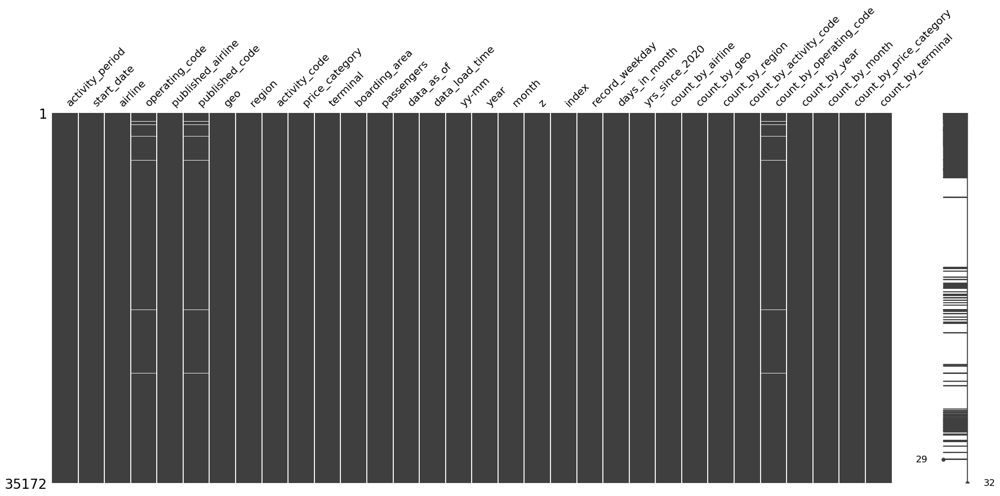

In [ ]:
import missingno as msno
%matplotlib inline

msno.matrix(data)

In [ ]:
data.isnull().sum()

activity_period              0
start_date                   0
airline                      0
operating_code             316
published_airline            0
published_code             316
geo                          0
region                       0
activity_code                0
price_category               0
terminal                     0
boarding_area                0
passengers                   0
data_as_of                   0
data_load_time               0
yy-mm                        0
year                         0
month                        0
z                            0
index                        0
record_weekday               0
days_in_month                0
yrs_since_2020               0
count_by_airline             0
count_by_geo                 0
count_by_region              0
count_by_activity_code       0
count_by_operating_code    316
count_by_year                0
count_by_month               0
count_by_price_category      0
count_by_terminal            0
dtype: i

In [ ]:
data.operating_code.fillna("unspecified", inplace=True)
data.published_code.fillna("unspecified", inplace=True)

In [ ]:
# Add features to include: counting by different features
specific_cols = ['airline', 'geo', 'region', 'activity_code', 'operating_code', 'year', 'month', 'price_category', 'terminal']
for col in specific_cols:
    data["count_by_"+col] = data[col].replace(data.groupby([col]).size().to_dict())

In [ ]:
more_stats = data\
                .groupby(['airline', 'price_category', 'geo', 'region', 'activity_code', 'operating_code'])\
                ['passengers']\
                .agg(['mean','median', 'min', 'max'])\
                .rename(columns=lambda colname: str(colname)+'_passengers')\
                .reset_index()

In [ ]:
master_df = pd.merge(data, more_stats, on = ['airline', 'price_category', 'geo', 'region', 'activity_code', 'operating_code'], how = "left")

In [ ]:
more_stats.head()

,airline,price_category,geo,region,activity_code,operating_code,mean_passengers,median_passengers,min_passengers,max_passengers
0,ABC Aerolineas S.A. de C.V. dba Interjet,Other,International,Mexico,Deplaned,4O,3901.040039,3958.0,1090.0,7071.0
1,ABC Aerolineas S.A. de C.V. dba Interjet,Other,International,Mexico,Enplaned,4O,3914.120117,3870.0,1212.0,7448.0
2,ATA Airlines,Low Fare,Domestic,US,Deplaned,TZ,25690.494141,23585.0,48.0,49777.0
3,ATA Airlines,Low Fare,Domestic,US,Enplaned,TZ,26195.255859,24084.5,48.0,48949.0
4,ATA Airlines,Low Fare,Domestic,US,Thru / Transit,TZ,2441.638184,2402.0,85.0,6019.0


In [ ]:
!pip install missingno

In [ ]:
del master_df["start_date"]

In [ ]:
del master_df["index"]

In [ ]:
master_df.head()

,activity_period,airline,operating_code,published_airline,published_code,geo,region,activity_code,price_category,terminal,...,count_by_activity_code,count_by_operating_code,count_by_year,count_by_month,count_by_price_category,count_by_terminal,mean_passengers,median_passengers,min_passengers,max_passengers
0,199907,ATA Airlines,TZ,ATA Airlines,TZ,Domestic,US,Deplaned,Low Fare,Terminal 1,...,16437,271,760,3090,3824,6486,25690.494141,23585.0,48.0,49777.0
1,199907,ATA Airlines,TZ,ATA Airlines,TZ,Domestic,US,Enplaned,Low Fare,Terminal 1,...,16629,271,760,3090,3824,6486,26195.255859,24084.5,48.0,48949.0
2,199907,ATA Airlines,TZ,ATA Airlines,TZ,Domestic,US,Thru / Transit,Low Fare,Terminal 1,...,2106,271,760,3090,3824,6486,2441.638184,2402.0,85.0,6019.0
3,199907,Aeroflot Russian International Airlines,unspecified,Aeroflot Russian International Airlines,unspecified,International,Europe,Deplaned,Other,Terminal 2,...,16437,316,760,3090,31348,2310,1063.754395,990.0,425.0,2005.0
4,199907,Aeroflot Russian International Airlines,unspecified,Aeroflot Russian International Airlines,unspecified,International,Europe,Enplaned,Other,Terminal 2,...,16629,316,760,3090,31348,2310,997.526306,915.0,434.0,2109.0


In [ ]:
master_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35172 entries, 0 to 35171
Data columns (total 34 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   activity_period          35172 non-null  int64  
 1   airline                  35172 non-null  object 
 2   operating_code           35172 non-null  object 
 3   published_airline        35172 non-null  object 
 4   published_code           35172 non-null  object 
 5   geo                      35172 non-null  object 
 6   region                   35172 non-null  object 
 7   activity_code            35172 non-null  object 
 8   price_category           35172 non-null  object 
 9   terminal                 35172 non-null  object 
 10  boarding_area            35172 non-null  object 
 11  passengers               35172 non-null  float32
 12  data_as_of               35172 non-null  object 
 13  data_load_time           35172 non-null  object 
 14  yy-mm                 

<ipython-input-88-9eb4eba30c23>:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: >

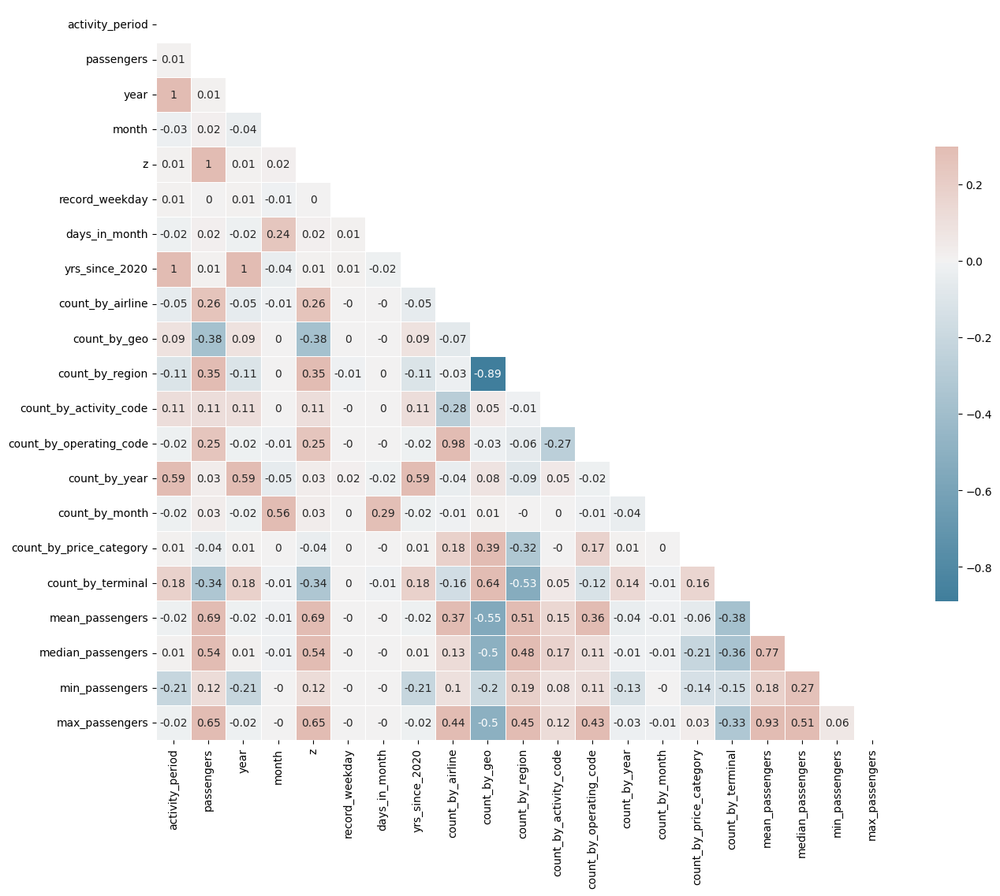

In [ ]:
# Compute the correlation matrix
corr = master_df.corr().round(2)

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(15, 15))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0, annot=True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [ ]:
# fill missing values with conditional probability? Or perhaps odds ratio

In [ ]:
# data['US_holiday']  = data.day_off_flg.shift(-1).fillna(0).astype(int)